In [3]:
!pip install torch==1.7.1+cu101 torchvision==0.8.2+cu101 torchaudio==0.7.2 -f https://download.pytorch.org/whl/torch_stable.html
!pip install cython pyyaml==5.1
!pip install -U 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'

Looking in links: https://download.pytorch.org/whl/torch_stable.html
     |████████████████████████████████| 735.4 MB 20 kB/s  eta 0:00:015 | 616.4 MB 7.5 MB/s eta 0:00:16
     |████████████████████████████████| 7.6 MB 1.2 MB/s eta 0:00:01
     |████████████████████████████████| 12.8 MB 6.9 MB/s eta 0:00:01
  Attempting uninstall: torch
    Found existing installation: torch 1.2.0+cpu
    Uninstalling torch-1.2.0+cpu:
      Successfully uninstalled torch-1.2.0+cpu
  Attempting uninstall: torchvision
    Found existing installation: torchvision 0.4.0+cpu
    Uninstalling torchvision-0.4.0+cpu:
      Successfully uninstalled torchvision-0.4.0+cpu
  Cloning https://github.com/cocodataset/cocoapi.git to /tmp/pip-req-build-y2m1ftb_
  Created wheel for pycocotools: filename=pycocotools-2.0-cp37-cp37m-linux_x86_64.whl size=369775 sha256=a1790133670f99900661fe0164cc4016d5a6d62de74edd0ccf8eaef24a321f62
  Stored in directory: /tmp/pip-ephem-wheel-cache-umk9bfdq/wheels/e2/6b/1d/344ac773c7495ea0b8

In [4]:
!git clone https://github.com/facebookresearch/detectron2.git detectron2_repo
!python -m pip install -e detectron2_repo

Cloning into 'detectron2_repo'...
remote: Enumerating objects: 6, done.
remote: Counting objects: 100% (6/6), done.
remote: Compressing objects: 100% (6/6), done.
remote: Total 9848 (delta 0), reused 1 (delta 0), pack-reused 9842
Receiving objects: 100% (9848/9848), 3.89 MiB | 4.76 MiB/s, done.
Resolving deltas: 100% (7251/7251), done.
Obtaining file:///home/ekaterina/Work/find_new/detectron2_repo
  Using cached iopath-0.1.2.tar.gz (10 kB)
     |████████████████████████████████| 2.2 MB 3.0 MB/s eta 0:00:01
  Using cached pycocotools-2.0.2.tar.gz (23 kB)
  Using cached yacs-0.1.8-py3-none-any.whl (14 kB)
  Using cached cloudpickle-1.6.0-py3-none-any.whl (23 kB)
  Using cached portalocker-2.0.0-py2.py3-none-any.whl (11 kB)
  Using cached tabulate-0.8.7-py3-none-any.whl (24 kB)
  Created wheel for fvcore: filename=fvcore-0.1.2.post20210112-py3-none-any.whl size=40788 sha256=5e51b2a79901bfdd4d5fcf845a9c8721a652c78817e936a32e7b59a3f3a86521
  Stored in directory: /home/ekaterina/.cache/pip/w

In [1]:
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

import os
import json
import matplotlib.pyplot as plt
import random
from datetime import datetime
import pickle
from pathlib import Path
from tqdm.notebook import tqdm
import numpy as np
import cv2
import random
import imageio

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer,ColorMode
from detectron2.data import DatasetCatalog, MetadataCatalog
from detectron2.structures import BoxMode
from sklearn.neighbors import KNeighborsClassifier

In [2]:
from skimage import segmentation

In [3]:
os.environ["KMP_DUPLICATE_LIB_OK"]="TRUE"

import os
import sys
import torch
sys.path.append('../')
from SuperGluePretrainedNetwork.models.matching import Matching
from SuperGluePretrainedNetwork.models.utils import (compute_pose_error, compute_epipolar_error,
                          estimate_pose, make_matching_plot,
                          error_colormap, AverageTimer, pose_auc, read_image,
                          rotate_intrinsics, rotate_pose_inplane,
                          scale_intrinsics)
device = 'cuda' if torch.cuda.is_available() and not opt.force_cpu else 'cpu'

/home/ekaterina/Work/environments/myvenv1/lib/python3.7/site-packages/torch/cuda/__init__.py:52: UserWarning: CUDA initialization: Found no NVIDIA driver on your system. Please check that you have an NVIDIA GPU and installed a driver from http://www.nvidia.com/Download/index.aspx (Triggered internally at  /pytorch/c10/cuda/CUDAFunctions.cpp:100.)
  return torch._C._cuda_getDeviceCount() > 0


In [15]:
NMS_RADIUS = 3
KEYPOINT_THRESHOLD = 5e-4
MAX_KEYPOINTS = 4096*2
WEIGHTS = 'outdoor'
SINKHORN_ITERATIONS = 150
MATCH_THRESHOLD = 0.5
RESIZE = [1200]
RESIZE_FLOAT = True
ROT0 = 0
ROT1 = 0

config = {
        'superpoint': {
            'nms_radius': NMS_RADIUS,
            'keypoint_threshold': KEYPOINT_THRESHOLD,
            'max_keypoints': MAX_KEYPOINTS
        },
        'superglue': {
            'weights': WEIGHTS,
            'sinkhorn_iterations': SINKHORN_ITERATIONS,
            'match_threshold': MATCH_THRESHOLD,
        }
    }

matching = Matching(config).eval().to(device)
torch.set_grad_enabled(False)

Loaded SuperPoint model
Loaded SuperGlue model ("outdoor" weights)


In [5]:
def add_classes(marked_img):
    new_marked_img= marked_img.copy()
    
    print("Add a bit class")
    for clas_indx in tqdm(np.unique(new_marked_img)[1:]):
        mask = np.zeros(new_marked_img.shape)
        mask[new_marked_img==clas_indx]=255

        _, contours, _ = cv2.findContours(mask.astype(bool).astype(np.uint8), cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
        if len(contours)>1:
            for contr in contours:
                rect = cv2.boundingRect(contr)
                x, y, w, h = rect
                if w*h>(mask.shape[0]*mask.shape[1])/10000:
                    max_v = max(np.unique(new_marked_img))+1
                    new_marked_img[y:y+h,x:x+w][new_marked_img[y:y+h,x:x+w]==clas_indx]=max_v

    return new_marked_img

def calculate_points(mask, points0,points1):
    points0_new = []
    points1_new = []
    points_new_idx=[]
    
    points0 = points0.tolist()
    points1 = points1.tolist()
    
    for idx in range(len(points1)):
        if mask[int(points1[idx][1]),int(points1[idx][0])]==255:
            if len(points_new_idx)==0:
                points_new_idx.append(idx)
            elif idx not in points_new_idx:
                points_new_idx.append(idx)

    if len(points_new_idx)>0:
        points_new_idx.sort()
        for indx in points_new_idx:
            points0_new.append(points0[indx])
            points1_new.append(points1[indx])

    return np.array(points0_new).astype(np.float32),np.array(points1_new).astype(np.float32)

def apply_mask(image, transformed_real, mask_real, inplace=False):
    if not inplace:
        image = image.copy()

    _, contours, _ = cv2.findContours(mask_real.astype(bool).astype(np.uint8), 1, 2)
    rect = cv2.boundingRect(contours[0])
    x, y, w, h = rect
    
    alp=1.25
    
    x_min = max(int(x-w*alp),0)
    x_max = min(int(x+w+w*alp),image.shape[1])
    y_min = max(int(y-h*alp),0)
    y_max = min(int(y+h+h*alp),image.shape[0])
    
    transformed = transformed_real[y_min:y_max,x_min:x_max]
    mask = mask_real[y_min:y_max,x_min:x_max]
    
    
    mask0 = cv2.resize(mask,(300,300))
    mask0 = cv2.resize(mask0,(mask.shape[1],mask.shape[0]))
    
    cx = x + w // 2
    cy = y + h // 2
    
    if cx>0 and cx<image.shape[1] and cy>0 and cy<image.shape[0]:
        image = cv2.seamlessClone(transformed.astype(np.uint8), image.astype(np.uint8), mask0.astype(np.uint8), (cx, cy), cv2.MIXED_CLONE )
    else:
        image[mask_real.astype(bool)] = transformed_real[mask_real.astype(bool)]
    return image

def apply_mask(image, transformed, mask, inplace=False):
    if not inplace:
        image = image.copy()
       
    image[mask.astype(bool)] = transformed[mask.astype(bool)]
    return image

def estimate_pose(kpts0, kpts1, K0, K1, thresh, conf=0.99999):
    if len(kpts0) < 5:
        return None

    f_mean = np.mean([K0[0, 0], K1[1, 1], K0[0, 0], K1[1, 1]])
    norm_thresh = thresh / f_mean
    
    E, mask = cv2.findEssentialMat(
        kpts0, kpts1, np.eye(3), threshold=norm_thresh, prob=conf,
        method=cv2.RANSAC)

    assert E is not None

    best_num_inliers = 0
    ret = None
    for _E in np.split(E, len(E) / 3):
        n, R, t, _ = cv2.recoverPose(
            _E, kpts0, kpts1, np.eye(3), 1e9, mask=mask)
        if n > best_num_inliers:
            best_num_inliers = n
            ret = (R, t[:, 0], mask.ravel() > 0)
    return ret

def transform_image(image0, image1, mask, points0, points1):
    h, _ = cv2.findHomography(points1, points0, cv2.RANSAC)
    #h=dlt(points0, points1)
    height, width, c = image0.shape
    if h is not None:
        
        transformed = cv2.warpPerspective(image1, h, (width, height))
        mask0 = cv2.warpPerspective(mask, h, (width, height))
        #print(int(len(mask[mask==255])//len(mask0[mask0==255])))
        #print((abs(len(mask[mask==255])-len(mask0[mask0==255])),len(mask[mask==255])*0.25))

        if abs(len(mask[mask==255])-len(mask0[mask0==255]))<len(mask[mask==255])*1.5:
            return transformed, mask0
        else:
            return None,None
    
    return None, None

def pipeline(points0, points1, image0, image1,masks0, masks1,predictor_panoptic):

    image0 = image0.copy()
    masks1 = add_classes(masks1)
    masks0 = add_classes(masks0)
    """
    panoptic_seg, segments_info = predictor_panoptic(image0[..., [2, 1, 0]])["panoptic_seg"]
    masks_panoptic = panoptic_seg.numpy()
    cut_index_data=[]
    for info in segments_info:
        if info['isthing']==True and info['category_id']==1 and info['score']>0.5:
            cut_index_data.append(info['id'])
    
    cut_mask=np.zeros(image0.shape[:2],dtype=np.int)
    if len(cut_index_data)>0:
        for indx in cut_index_data:
            cut_mask[masks_panoptic==indx]=1
    """
    
    print("Transforme...")
    for clas in tqdm(np.unique(masks1)[1:]):
        mask = np.zeros(masks1.shape, dtype=np.uint8)
        mask[masks1==clas]=255
        points0_new,points1_new = calculate_points(mask, points0,points1)
            
        if len(points0_new)>3:

            transformed, mask = transform_image(image0, image1, mask, points0_new, points1_new)
            #if 1 in np.unique(cut_mask):
            #    mask[cut_mask==1]=
                
            
            
            if transformed is not None and mask is not None:
                mask = cut2mask(mask,masks0,points1,points0)
                image0 = apply_mask(image0, transformed, mask, inplace=True)

    return image0


In [6]:

def cut2mask(mask1,masks0,points1,points0):

    masks_dict0=[]
    for cls in np.unique(masks0)[1:]:
        
        mask=np.zeros(masks0.shape, dtype=np.int)
        mask[masks0==cls]=1
        masks_dict0.append(mask)
    mask1=(mask1.astype(np.float32)/255.).astype(np.int)
    list_points_mask=[]
    for i in range(len(masks_dict0)):
        xs,ys= np.where(masks_dict0[i]+mask1==2)
        if len(xs)>0:
            list_points_mask.append([xs,ys])
    mask = np.zeros(mask1.shape,dtype=np.uint8)
    for x,y in list_points_mask:
        mask[x,y]=255
    return mask

In [7]:
cut_categor = ['sky-other-merged','person']

def get_panoptic_categories():
    with open('COCO_CATEGORIES.json', 'r') as f:
        categories = json.load(f)
    indx=1
    for data in categories:
        if data['isthing']==0:
            data['id']=indx
            indx+=1
        if data['isthing']==0:
            data['id']=data['id']-1
            
    new_categories=[{},{}]
    for data in categories:
        if data['isthing']==1:
            new_categories[1][data['id']]=data
        if data['isthing']==0:
            new_categories[0][data['id']]=data

    
    return new_categories

def adjust_gamma(image, gamma=1.0):
    invGamma = 1.0 / gamma
    table = np.array([((i / 255.0) ** invGamma) * 255
                      for i in np.arange(0, 256)]).astype("uint8")
    return cv2.LUT(image, table)

def calculate_lables(image):
    img = adjust_gamma(image[...,[2,1,0]], gamma=2.5)[...,[2,1,0]]
    segments_fz = segmentation.felzenszwalb(img, scale=max(image.shape)//8, sigma=0.5)
    #segments_fz = segmentation.slic(img,compactness=10,min_size_factor=0.2,spacing=[5, 1, 1],sigma=[0.25, 1, 0.25],start_label=1)
    return np.array(segments_fz)

def intersect2d(a, b):
    return np.array([x for x in set(tuple(x) for x in a) & set(tuple(x) for x in b)])

def cluster(data, maxgap):
    data.sort()
    groups = [[data[0]]]
    for x in data[1:]:
        if abs(x - groups[-1][-1]) <= maxgap:
            groups[-1].append(x)
        else:
            groups.append([x])
    return groups

def preproc_superpixel_mask(mask,mark_back, mask_cut,image):
    new_mask = mask.copy()
    mask_and = mask+mask_cut
    plt.imshow(mask_and)
    plt.show()
    xs,ys = np.where(mask_and==0)
    mark_class_list =np.unique(mark_back[xs,ys])
    mark_class_list_new=[]

    for cls in tqdm(mark_class_list):
        xs,ys = np.where(mark_back==cls)
        values = np.unique(new_mask[xs,ys])
        max_v = -1
        val=-1
        for v in values:
            if len(new_mask[xs,ys][new_mask[xs,ys]==v])>max_v:
                max_v=len(new_mask[xs,ys][new_mask[xs,ys]==v])
                val=v
        new_mask[xs,ys]=val

    plt.imshow(new_mask)
    plt.show()
    mask_cut = 1-mask_cut
    mask_and = mask+mask_cut
    xs,ys = np.where(mask_and==0)
    for i_cls in tqdm(np.unique(mark_back[xs,ys])):
        if i_cls not in mark_class_list_new and i_cls not in mark_class_list:
            mark_class_list_new.append(i_cls)  
    n=np.zeros(mask.shape)
    for i_cls in  mark_class_list_new:
        n[mark_back==i_cls]=1
    x_train=[]
    y_train=[]
    for i  in tqdm(range(mask.shape[0])):
        for j  in range(mask.shape[1]):
            if mask[i,j]!=0:
                clr = image[i,j].astype(np.float32)/255.
                x_train.append([float(i)/float(mask.shape[0]),float(j)/float(mask.shape[1]),(clr[0]+clr[2])/2])
                y_train.append(mask[i,j])

    x_train = np.array(x_train)
    y_train = np.array(y_train)
    neigh = KNeighborsClassifier(n_neighbors=1)
    neigh.fit(x_train, y_train)
            
    for clas in tqdm(mark_class_list_new):
        xs, ys = np.where(mark_back==clas)
        colors=image[xs, ys].reshape(-1,3).astype(np.float32)/255.
        find_class = neigh.predict(np.stack([(xs).astype(np.float32)/float(mask.shape[0]), (ys).astype(np.float32)/float(mask.shape[1]),(colors[:,0]+colors[:,2])/2]).T)
        
        max_v = -1
        val=-1
        for v in np.unique(find_class):
            if len(new_mask[xs,ys][new_mask[xs,ys]==v])>=max_v:
                max_v=len(new_mask[xs,ys][new_mask[xs,ys]==v])
                val=v
        new_mask[xs,ys]=val
        
        
        #new_mask[xs,ys]=find_class
    
    return new_mask


def preprocess_mask(image, predictor_buildings,predictor_panoptic, coco_categories):
    
    image0=image.copy()
    print("Preprocess masks")
    outputs_buildings = predictor_buildings(image)
    
    pred = outputs_buildings["instances"].to("cpu")
    if pred.has("pred_masks"):
        masks = np.asarray(pred.pred_masks)
        #scores = np.array(pred.scores, dtype=np.float32)
        print("count masks: "+str(len(masks)))
        masks_dict=[]
        for mask in masks:
            masks_dict.append((mask).astype(np.int))
        
        for i in tqdm(range(len(masks_dict))):
            for j in range(i,len(masks_dict)):
                if i!=j and np.sum(masks_dict[i])<=np.sum(masks_dict[j]):
                    same_mask=masks_dict[i]+masks_dict[j]
                    if np.unique(same_mask)[-1]==2:
                        xs1 = np.sum((same_mask==1).astype(np.int))
                        xs2 = np.sum((same_mask==2).astype(np.int))
                        
                        if xs2/xs1>=0.05:
                            val = masks_dict[i]
                            masks_dict[i]=masks_dict[j]
                            masks_dict[j]=val
                            
        result_mask_build = np.zeros(image.shape[:2],dtype=np.int)
        alph=1
        for mask in masks_dict:
            result_mask_build[mask==1]=alph
            alph+=1
        plt.imshow(result_mask_build)
        plt.show()
        del masks_dict
        
        print("Panoptic segmentation")
        panoptic_seg, segments_info = predictor_panoptic(cv2.resize(image,(image.shape[1]//2,image.shape[0]//2)))["panoptic_seg"]
        masks_panoptic = panoptic_seg.numpy()
        masks_panoptic= cv2.resize(masks_panoptic,(image.shape[1],image.shape[0]),interpolation=cv2.INTER_NEAREST)
        plt.imshow(masks_panoptic)
        plt.show()
        cut_index_data = []
        for info in segments_info:
            if info['isthing']==True and info['score']>0.5:
                if int(info['category_id']+1) in coco_categories[1].keys():
                    if coco_categories[1][int(info['category_id']+1)]['name'] in cut_categor:
                        cut_index_data.append(info['id'])
            if info['isthing']==False:
                if int(info['category_id']-1) in coco_categories[0].keys():
                    if coco_categories[0][int(info['category_id']-1)]['name'] in cut_categor:
                        cut_index_data.append(info['id'])
        cut_mask=np.ones(result_mask_build.shape,dtype=np.int)
        if len(cut_index_data)>0:
            for indx in cut_index_data:
                cut_mask[masks_panoptic==indx]=0
        plt.imshow(cut_mask)
        plt.show()
        image = cv2.resize(image,(image.shape[1]//2,image.shape[0]//2))
        result_mask_build = cv2.resize(result_mask_build,(image.shape[1],image.shape[0]), interpolation=cv2.INTER_NEAREST)
        cut_mask = cv2.resize(cut_mask,(image.shape[1],image.shape[0]), interpolation=cv2.INTER_NEAREST)
        
        print("Superpixel segmentation")                          
        superpixel_mark = calculate_lables(image)
        plt.imshow(superpixel_mark)
        plt.show()
        
        print("Postprocess segmentation")
        result_mask = preproc_superpixel_mask(result_mask_build,superpixel_mark,cut_mask,image)
        result_mask = cv2.resize(result_mask,(image0.shape[1],image0.shape[0]), interpolation=cv2.INTER_NEAREST)
        
        return result_mask
        

In [8]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.rcParams['figure.figsize'] = (40,40)

In [9]:
cfg = get_cfg()

cfg.merge_from_file(model_zoo.get_config_file(
    "COCO-InstanceSegmentation/mask_rcnn_R_101_FPN_3x.yaml"
))
cfg.MODEL.WEIGHTS = "weights/model_final_new04.pth"

cfg.DATALOADER.NUM_WORKERS = 0

cfg.MODEL.ROI_HEADS.NUM_CLASSES = 2  # for the two classes window and building

cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = (
        0.50  # set the testing threshold for this model
    )

cfg.MODEL.DEVICE='cpu'

predictor_buildings = DefaultPredictor(cfg)


In [10]:
cfg = get_cfg()
cfg.MODEL.DEVICE='cpu'
cfg.merge_from_file(model_zoo.get_config_file("COCO-PanopticSegmentation/panoptic_fpn_R_101_3x.yaml"))
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-PanopticSegmentation/panoptic_fpn_R_101_3x.yaml")
predictor_panoptic = DefaultPredictor(cfg)



In [11]:
categories=get_panoptic_categories()

In [12]:

input_dir = '/home/ekaterina/Work/SuperGluePretrainedNetwork/assets/SamplePairsImageRegistration/'
imgs_list = [
    ['after_AH10x_0221_011_IMG_20200410_150014.jpg','before_AH10x_0221_011_IMG_20200410_150014.jpg'],
    ['before_AH10x_0229_011_IMG_20200410_150034.jpg','after_AH10x_0229_011_IMG_20200410_150034.jpg'],
    ['after_MJ10x_0024_IMG_20191226_135929.jpg','before_MJ10x_0024_IMG_20191226_135929_23_0_003_013_007_BE6I8878_8.2x.jpg'],
    ['after_MJ10x_0070_IMG_20191226_144808.jpg','before_MJ10x_0070_IMG_20191226_144808_69_0_002_002_056_BG5I3959_8.2x.jpg'],
    ['after_MJ10x_0013_IMG_20191226_135805.jpg','before_MJ10x_0013_IMG_20191226_135805_12_0_007_003_050_BE6I9652_8.2x.jpg']
]


In [13]:
input_dir = '/home/ekaterina/Work/find_new/技术合作测试数据内容/Registration_test/'
imgs_list = [
    ['Hard/004_01_02_L0.5m_Handle_IMG_20201024_152235_N.jpg','Hard/004_01_02_L0.5m_Handle_IMG_20201024_152235_N_1_jl_003_004_030_BE6I3772_8.2x_reg.JPG'],
    ['Hard/0113_01_02_R0.5m_Handle_IMG_20201130_150046_N.jpg','Hard/0113_01_02_R0.5m_Handle_IMG_20201130_150046_N_27_jl_0112_003_015.JPG'],
    ['Hard/119_02_01_0.0m_Handle_IMG_20201020_112709_N.jpg','Hard/119_02_01_0.0m_Handle_IMG_20201020_112709_N_462_jl_113_003_028_BE6I1757_8.2x.JPG'],
    ['Hard/MJ10x_0151_IMG_20191226_145437.jpg','Hard/MJ10x_0151_IMG_20191226_145437_150_0_021_001_049_BE6I7260_8.2x.JPG'],
    ['Medium/0201_01_01_0.0m_Handle_IMG_20201207_110457_M.jpg','Medium/0201_01_01_0.0m_Handle_IMG_20201207_110457_M_44_jl_0317_014_011.JPG'],
    ['Medium/202_03_07_R1.5m_Handle_IMG_20201023_144521_N.jpg','Medium/202_03_07_R1.5m_Handle_IMG_20201023_144521_N_1120_jl_203_004_031_AI5I6553_8.2x.JPG'],
    ['Easy/065_01_05_R0.5m_Handle_IMG_20201020_140907_N.jpg','Easy/065_01_05_R0.5m_Handle_IMG_20201020_140907_N_271_jl_065_005_046_BE6I3800_8.2x_reg.JPG'],
    ['Easy/0211_01_04_R1.5m_Handle_IMG_20201207_141423_N.jpg','Easy/0211_01_04_R1.5m_Handle_IMG_20201207_141423_N_80_jl_0213_014_016.JPG']
]


Predict points
Preprocess masks
count masks: 18


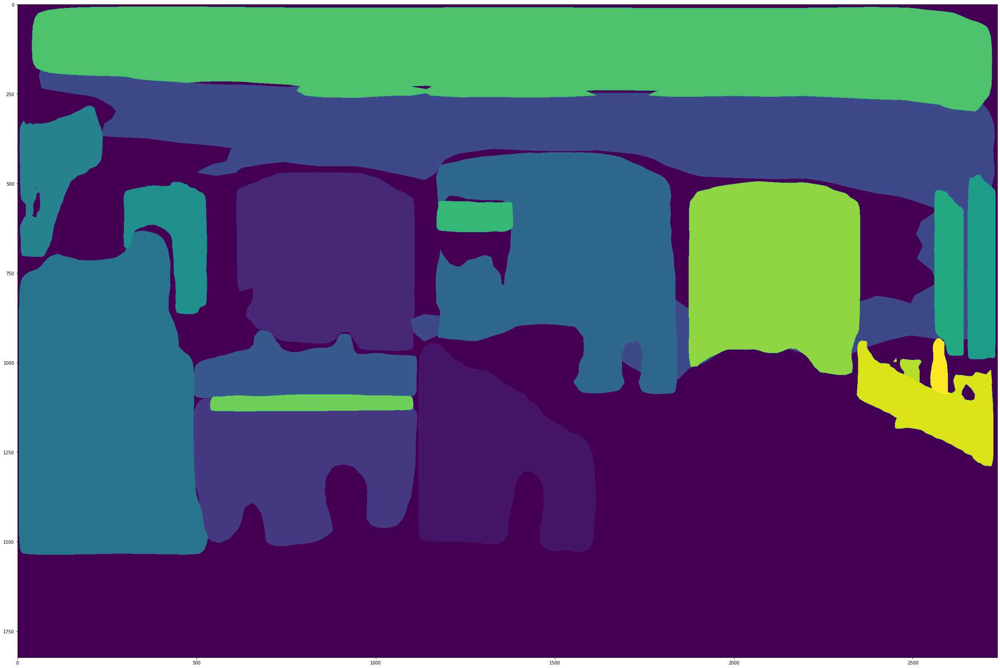

Panoptic segmentation


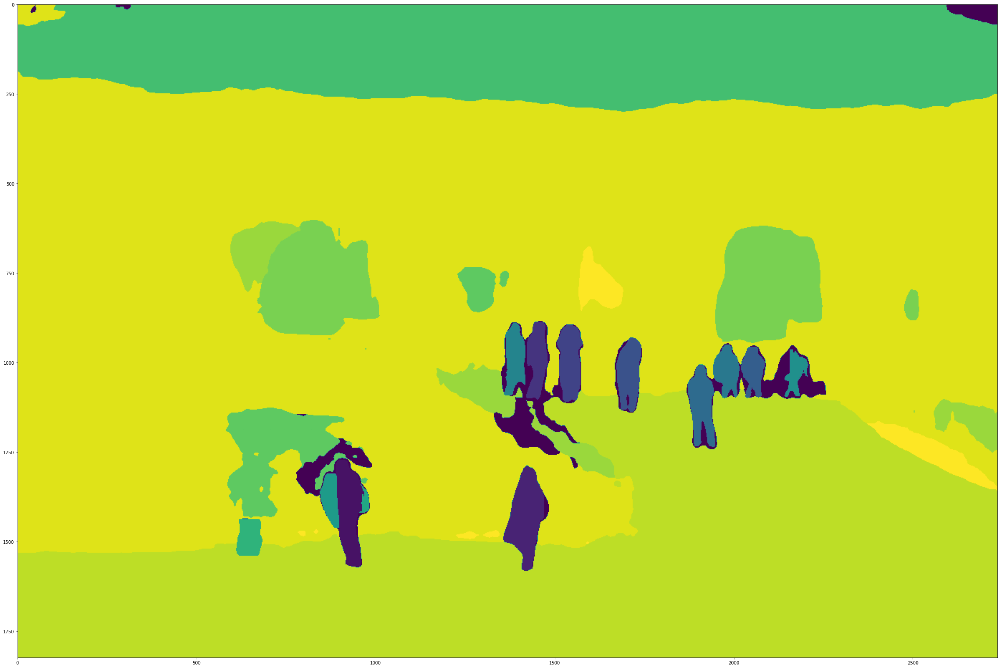

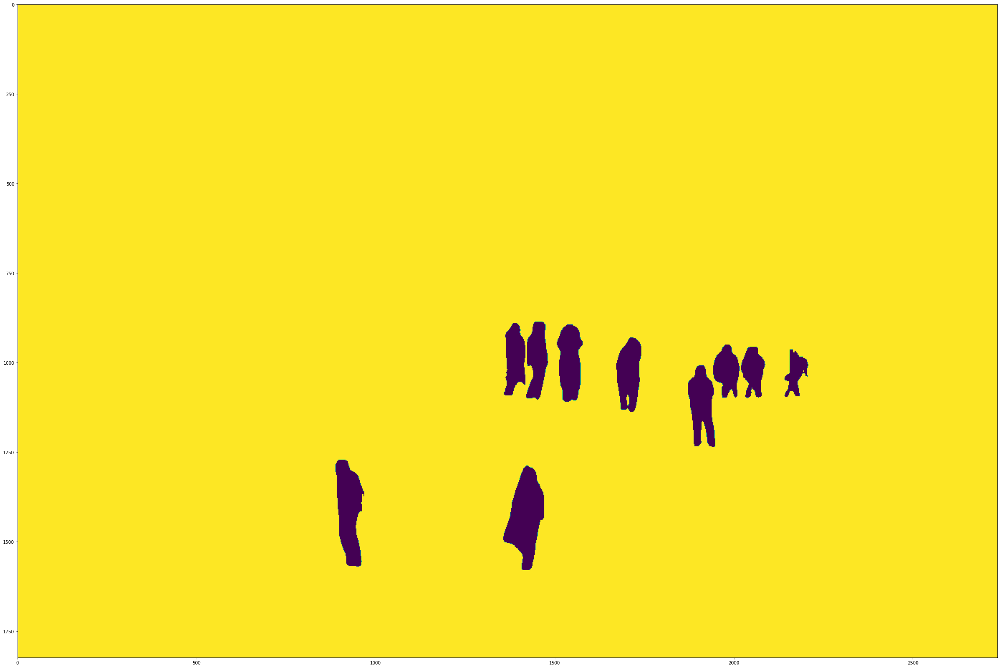

Superpixel segmentation


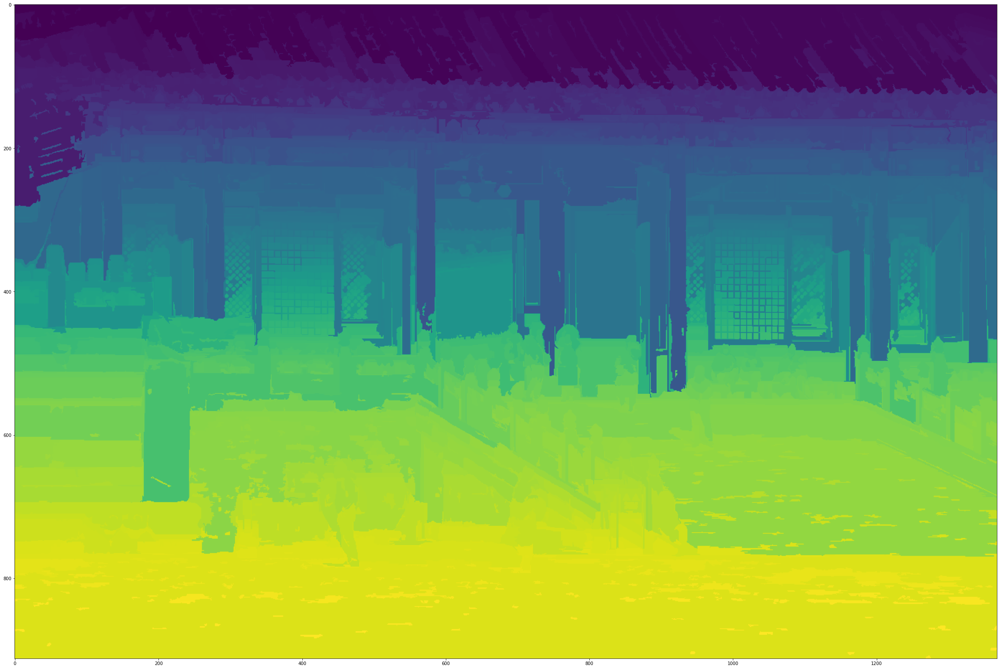

Postprocess segmentation


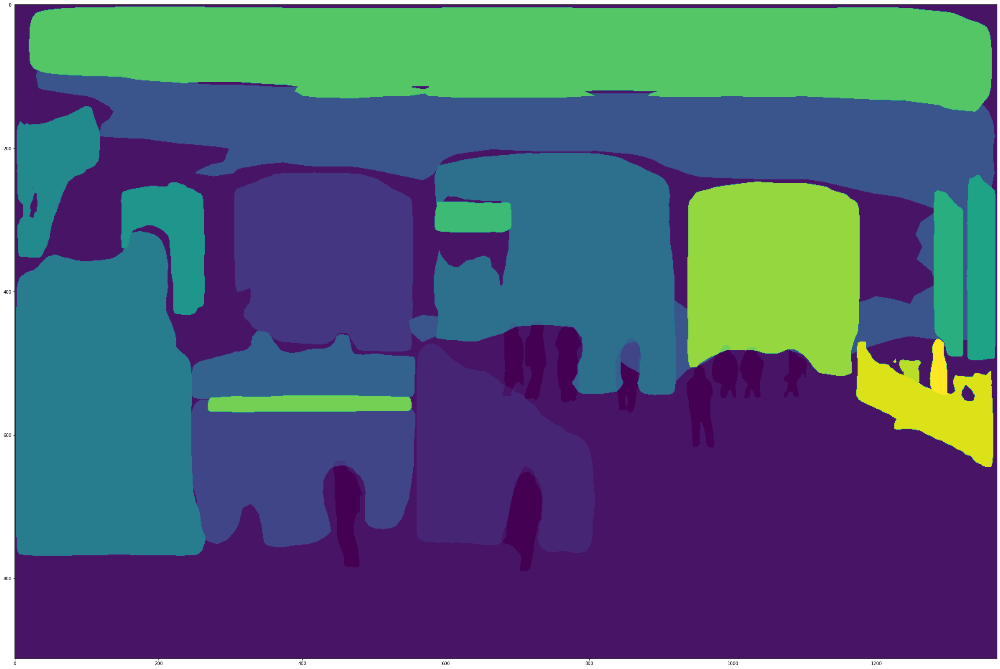

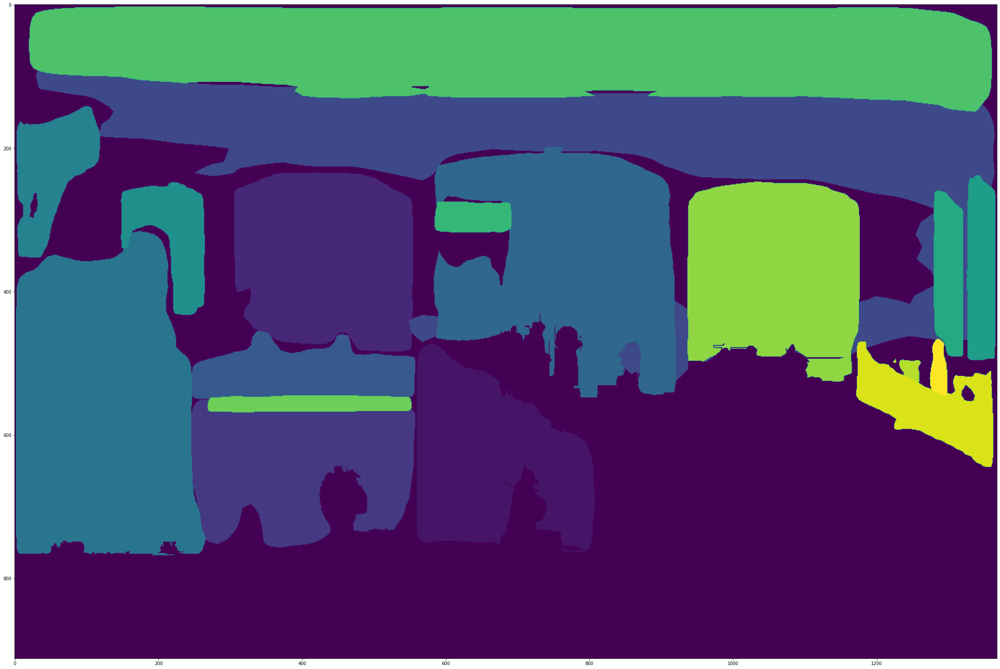

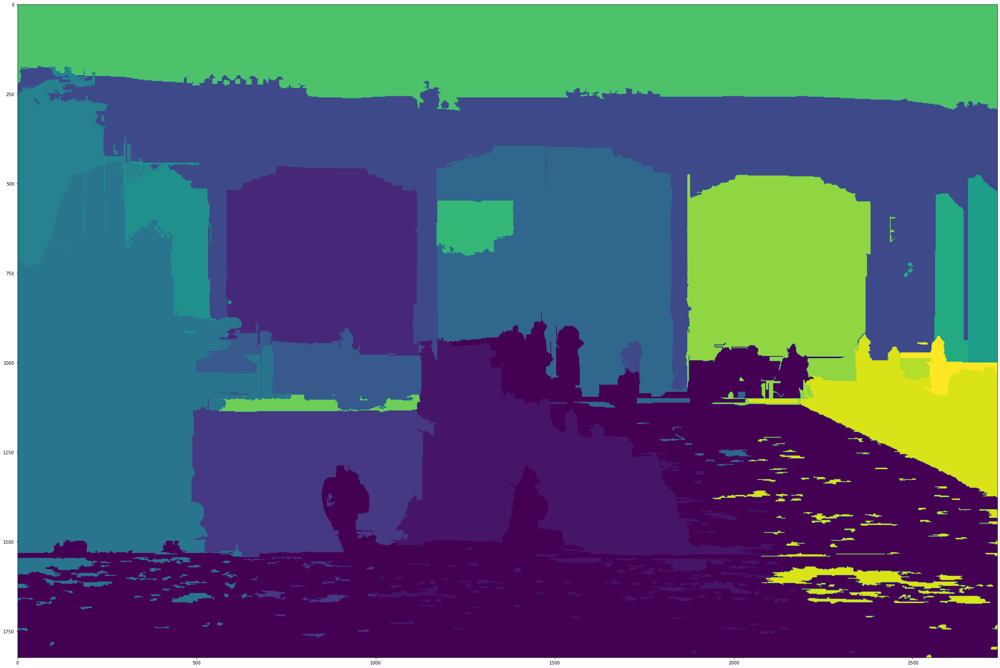

Lossy conversion from int32 to uint8. Range [0, 255]. Convert image to uint8 prior to saving to suppress this warning.


Preprocess masks
count masks: 14


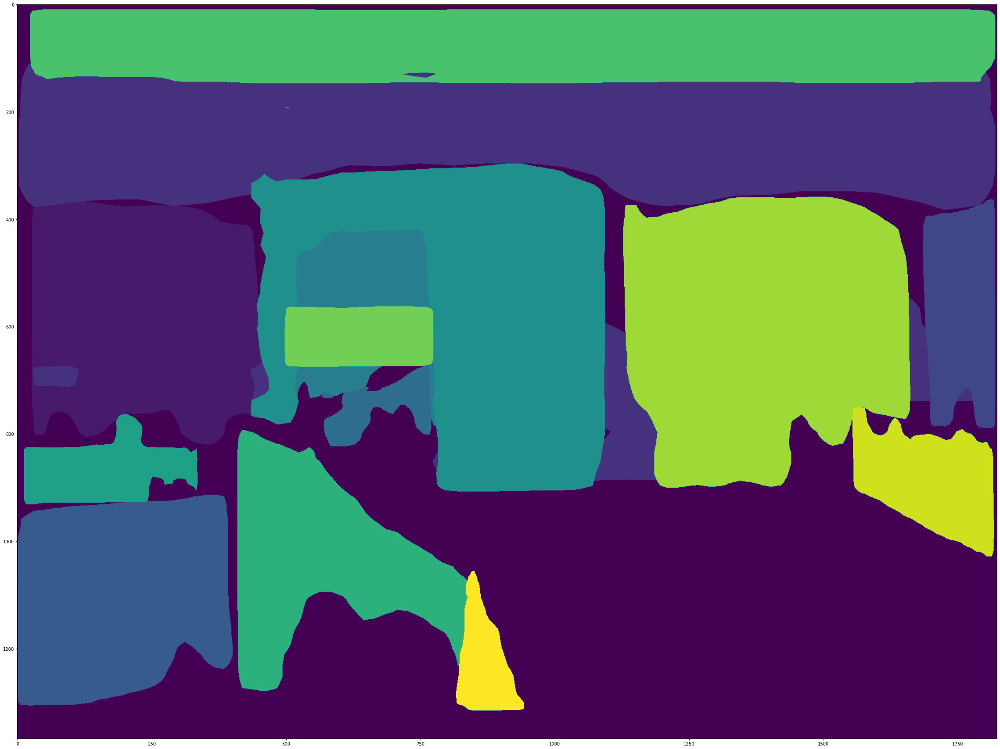

Panoptic segmentation


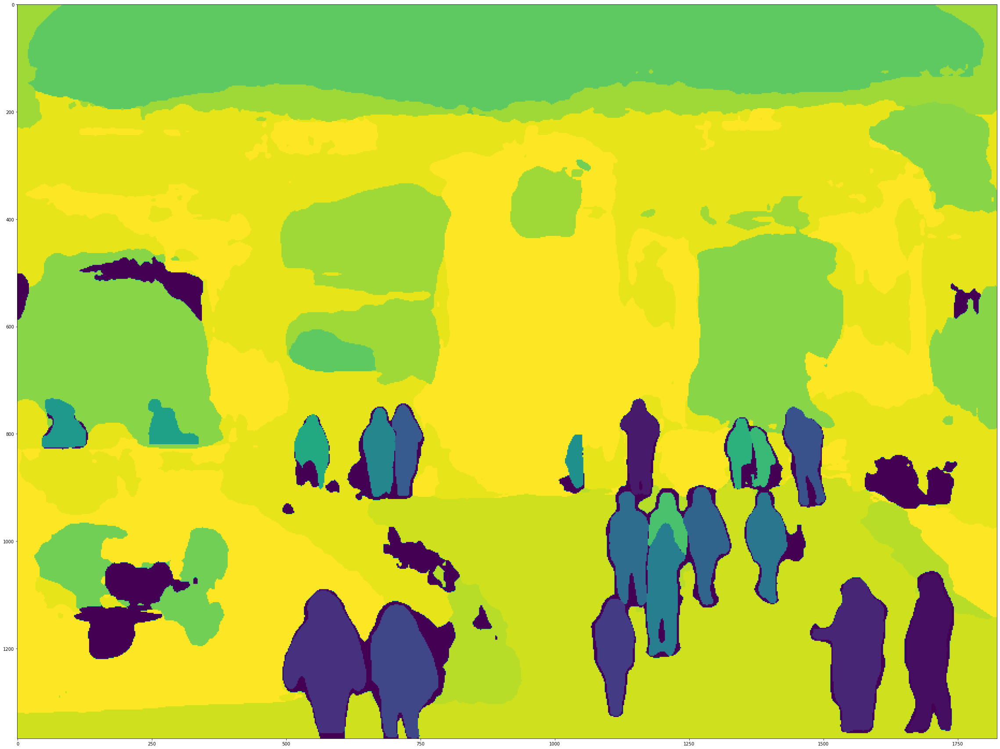

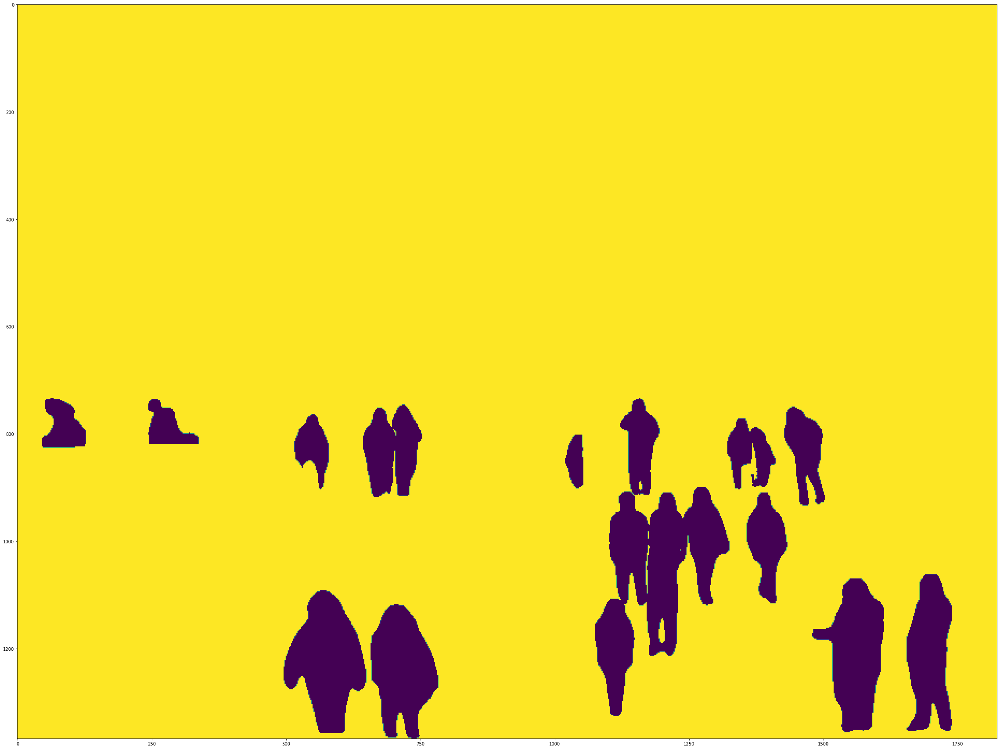

Superpixel segmentation


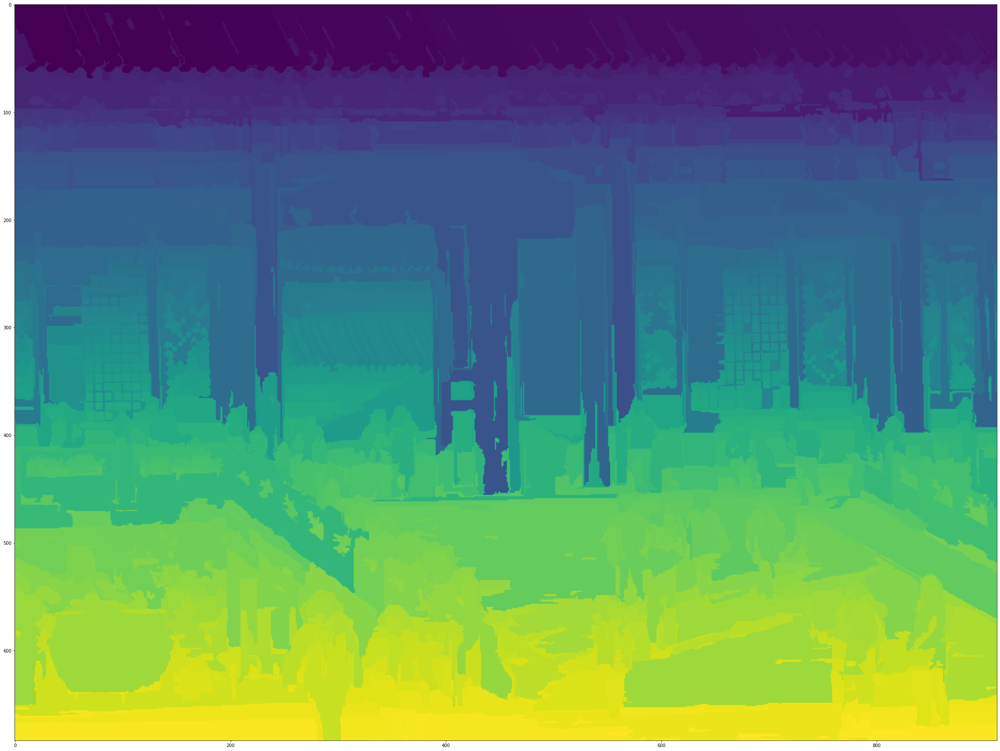

Postprocess segmentation


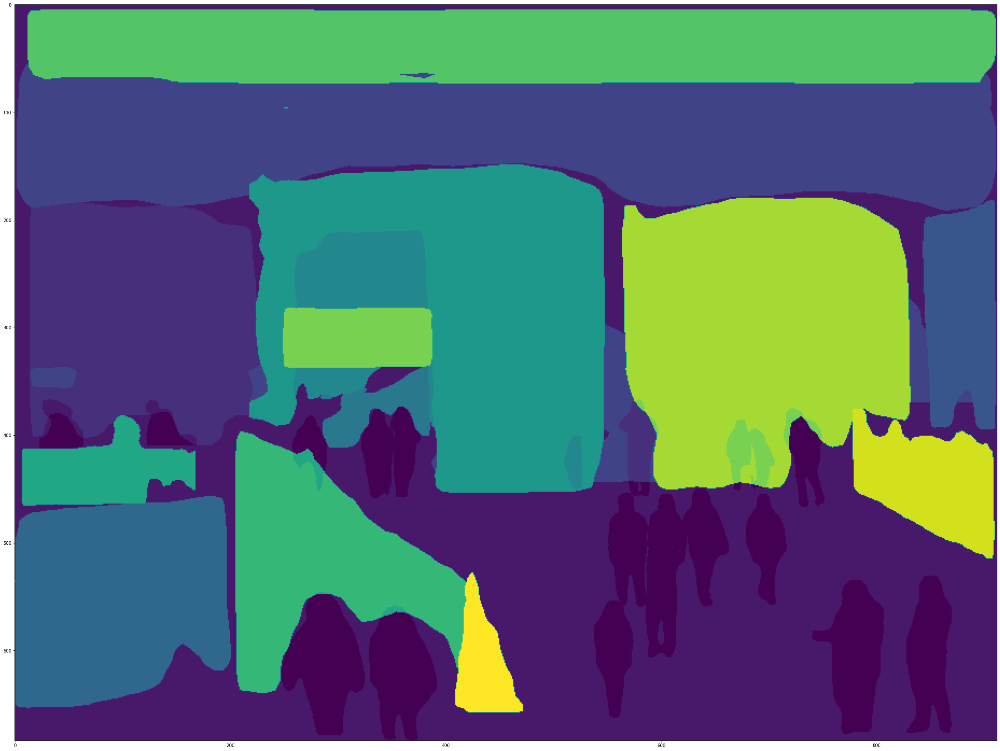

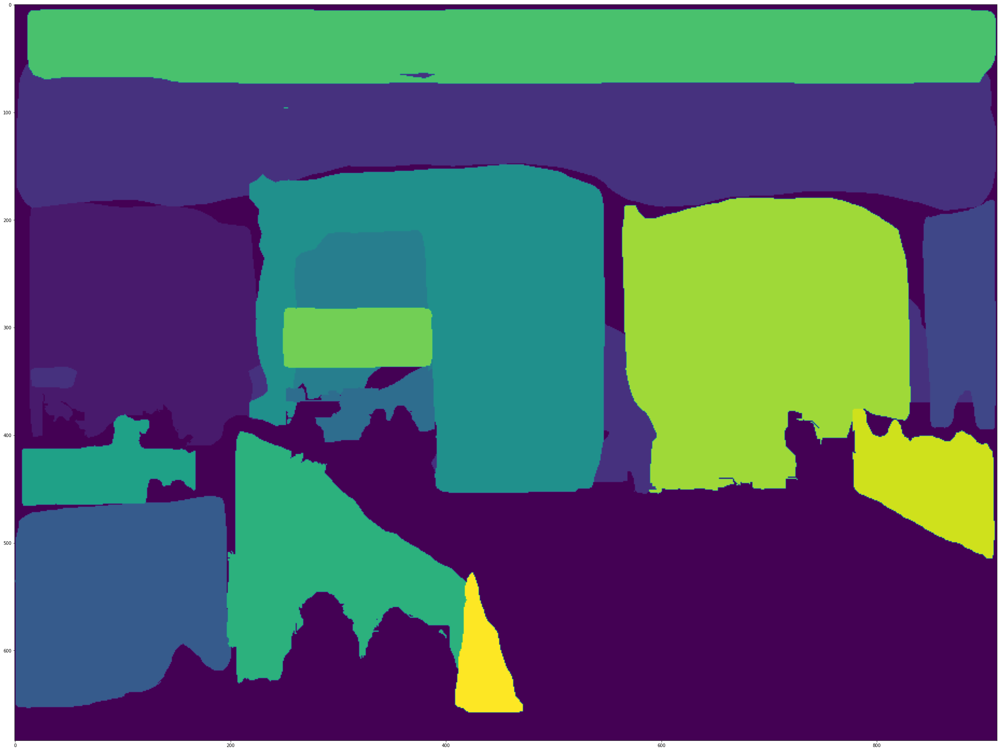

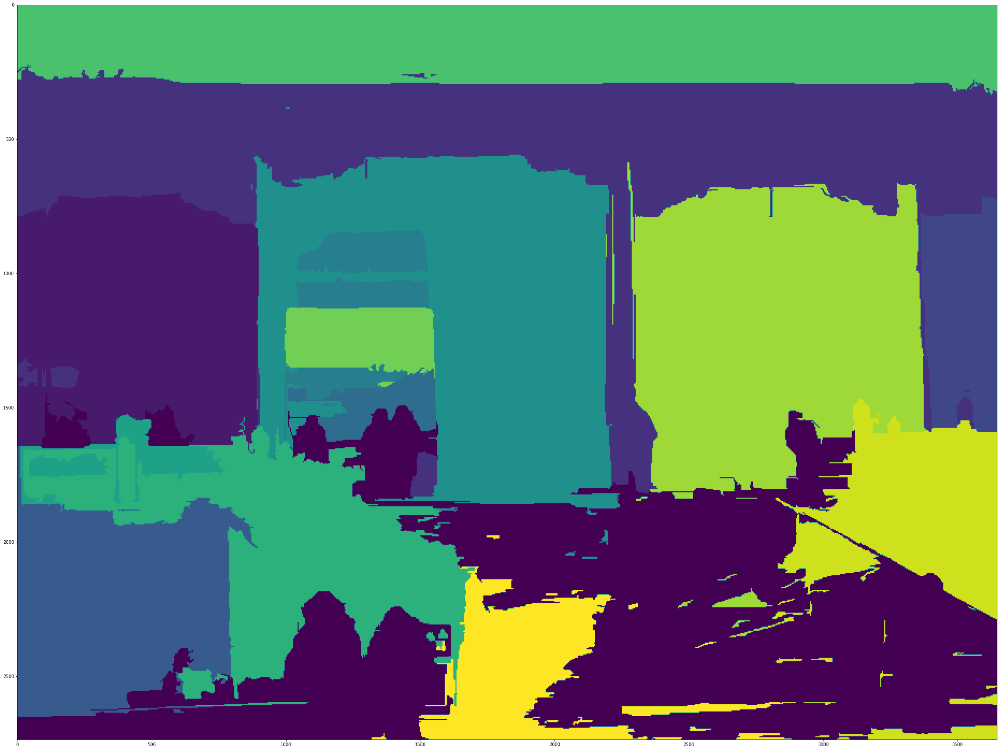

Add a bit class



Add a bit class



Transforme...


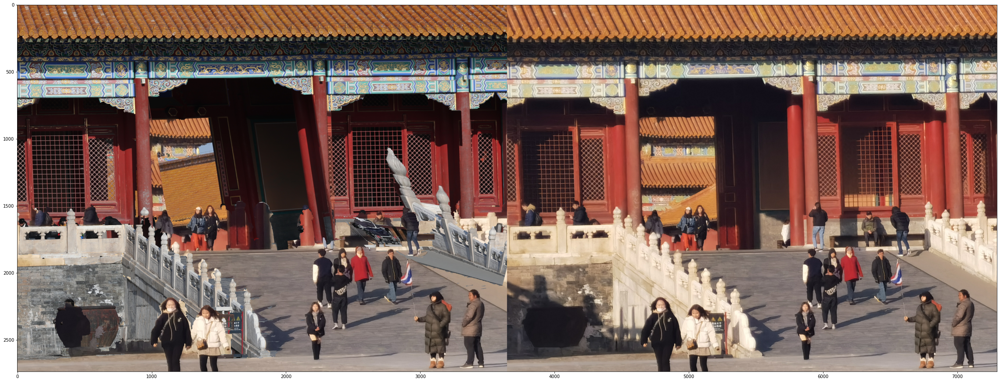

Predict points
Preprocess masks
count masks: 18


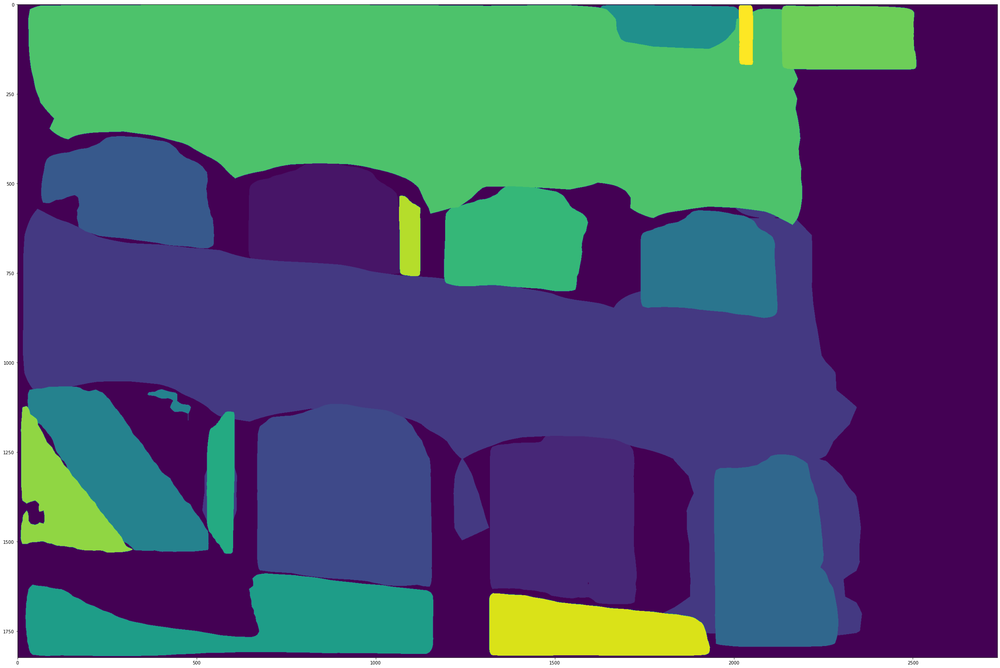

Panoptic segmentation


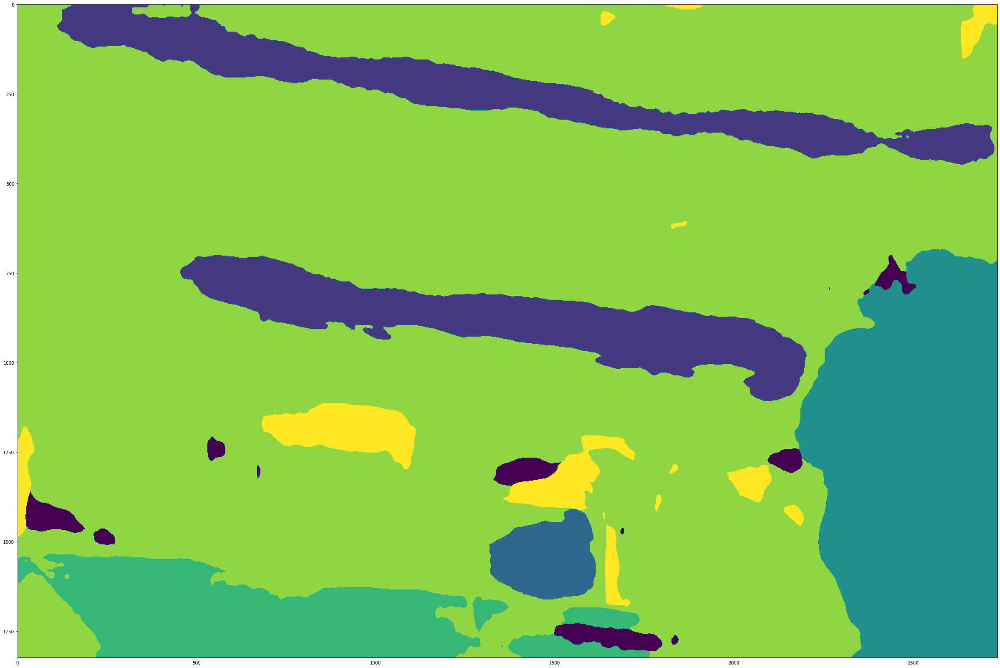

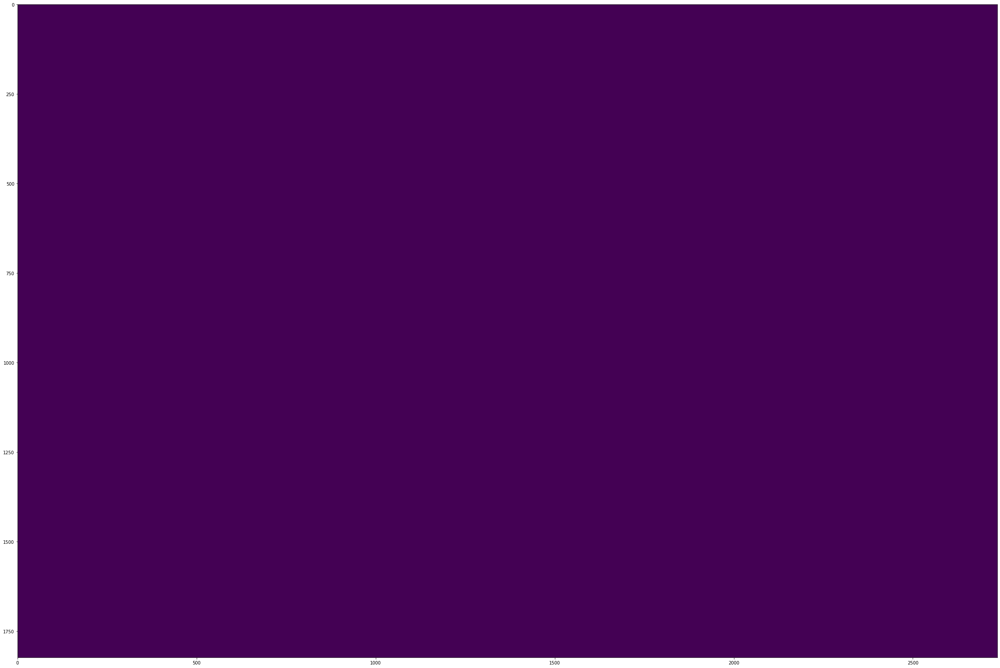

Superpixel segmentation


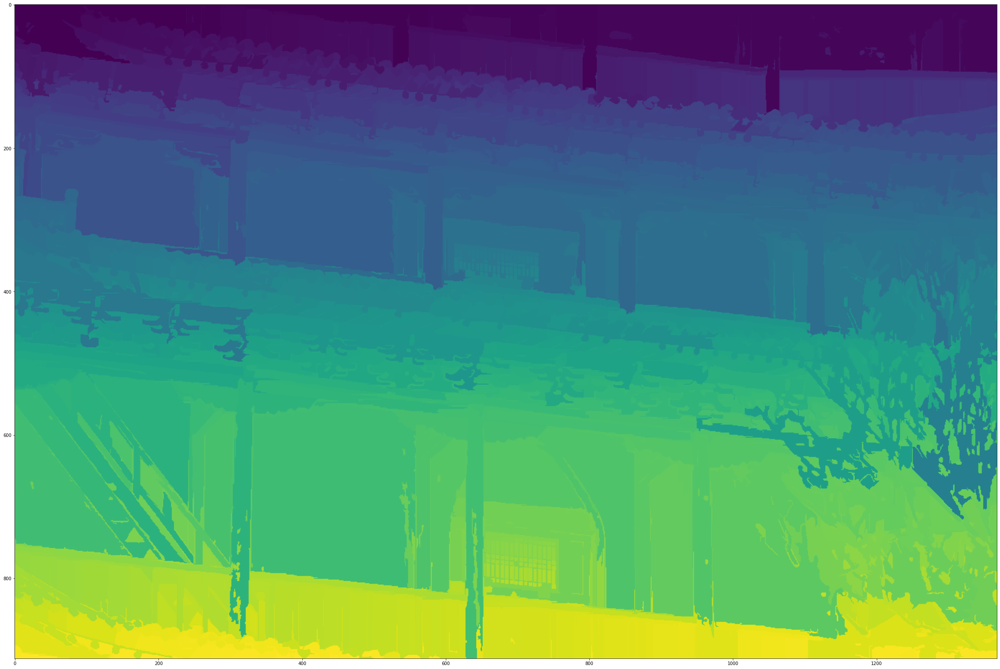

Postprocess segmentation


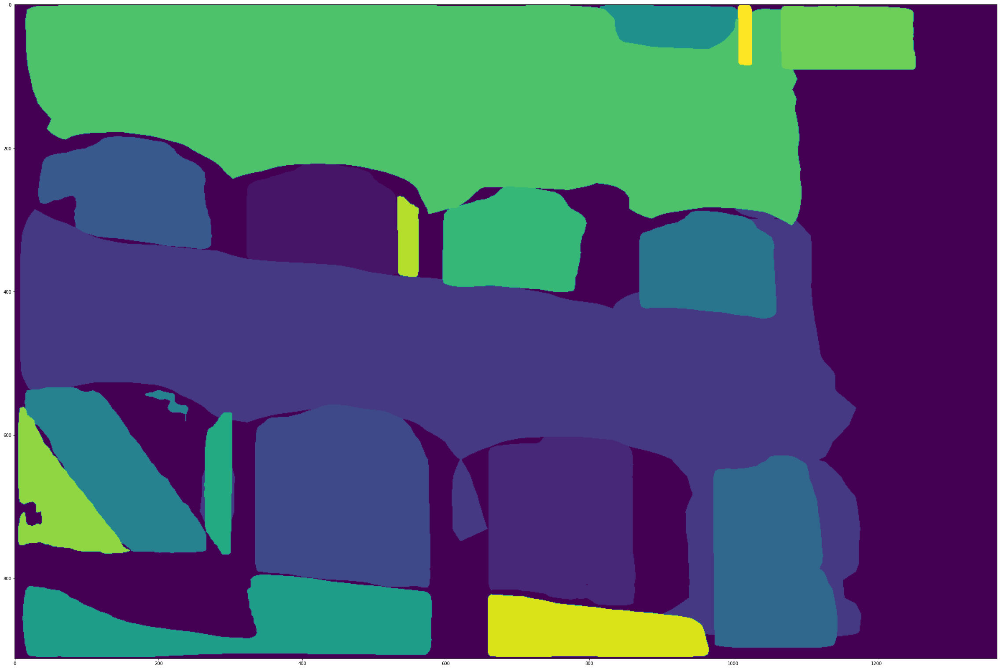

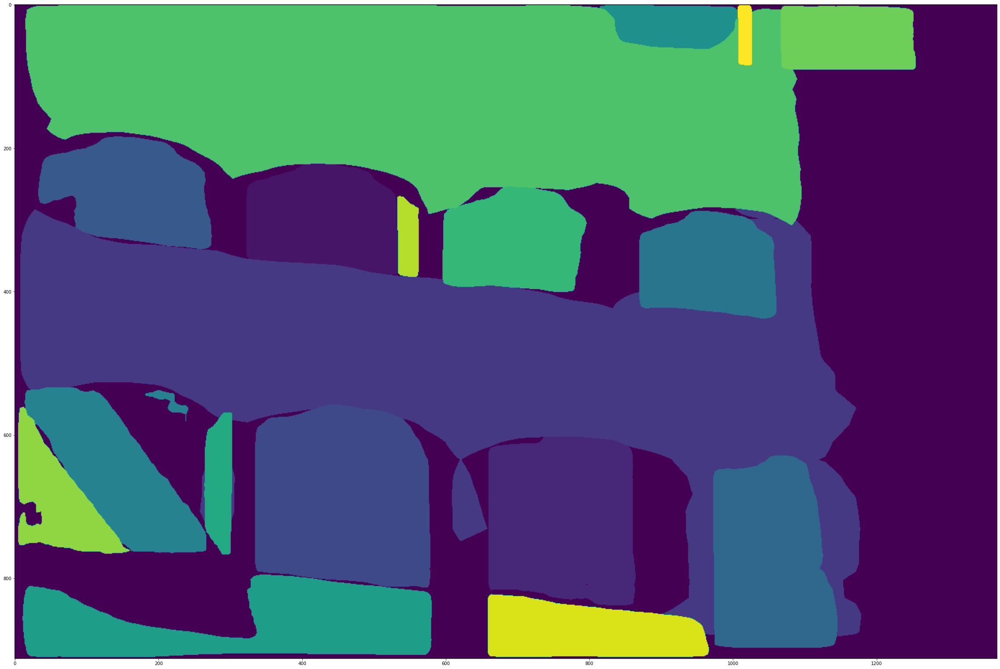

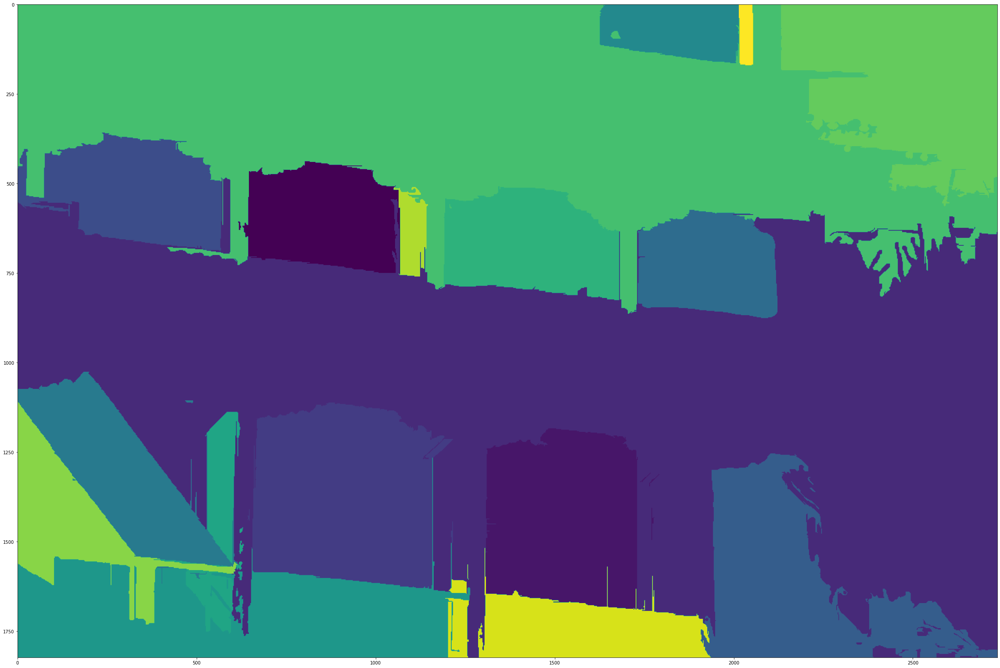

Lossy conversion from int32 to uint8. Range [0, 255]. Convert image to uint8 prior to saving to suppress this warning.


Preprocess masks
count masks: 16


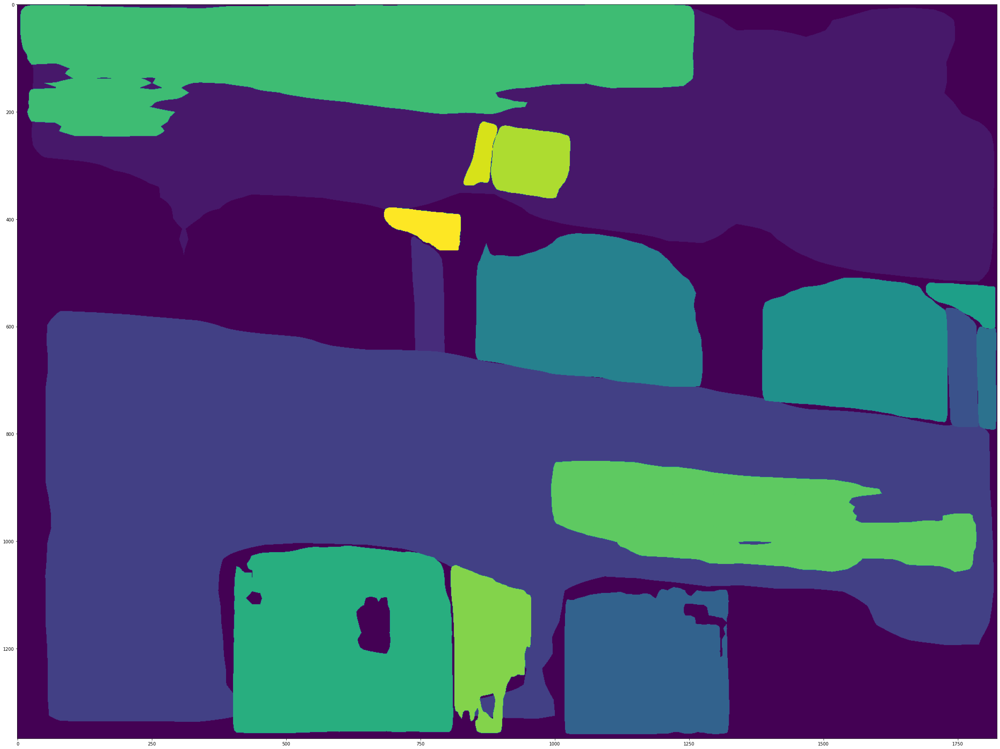

Panoptic segmentation


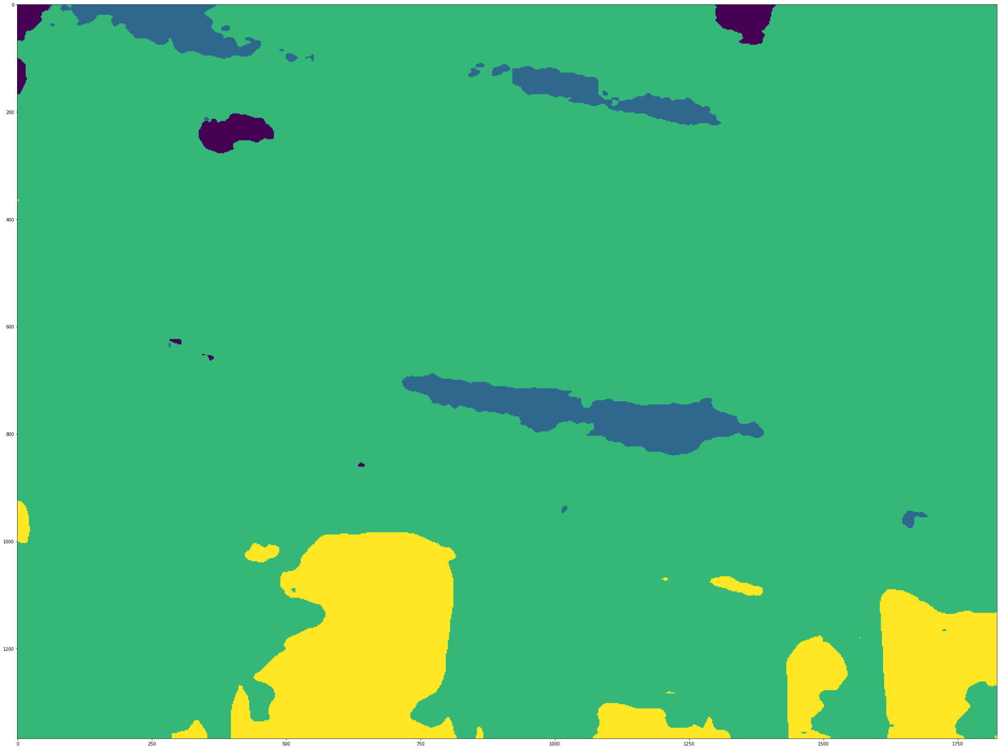

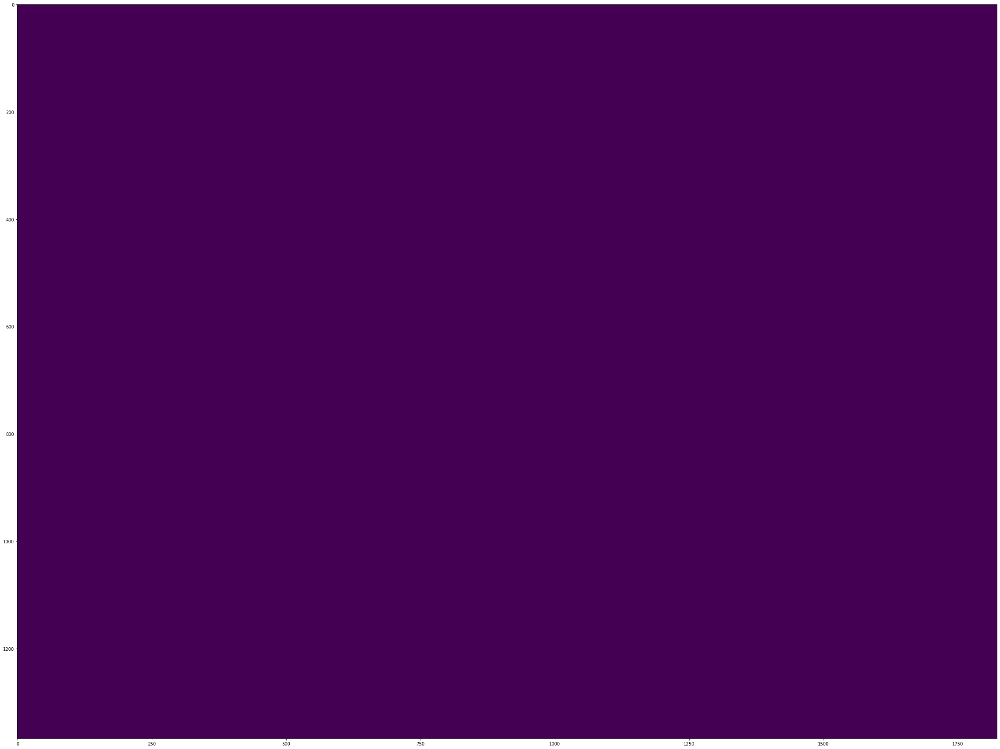

Superpixel segmentation


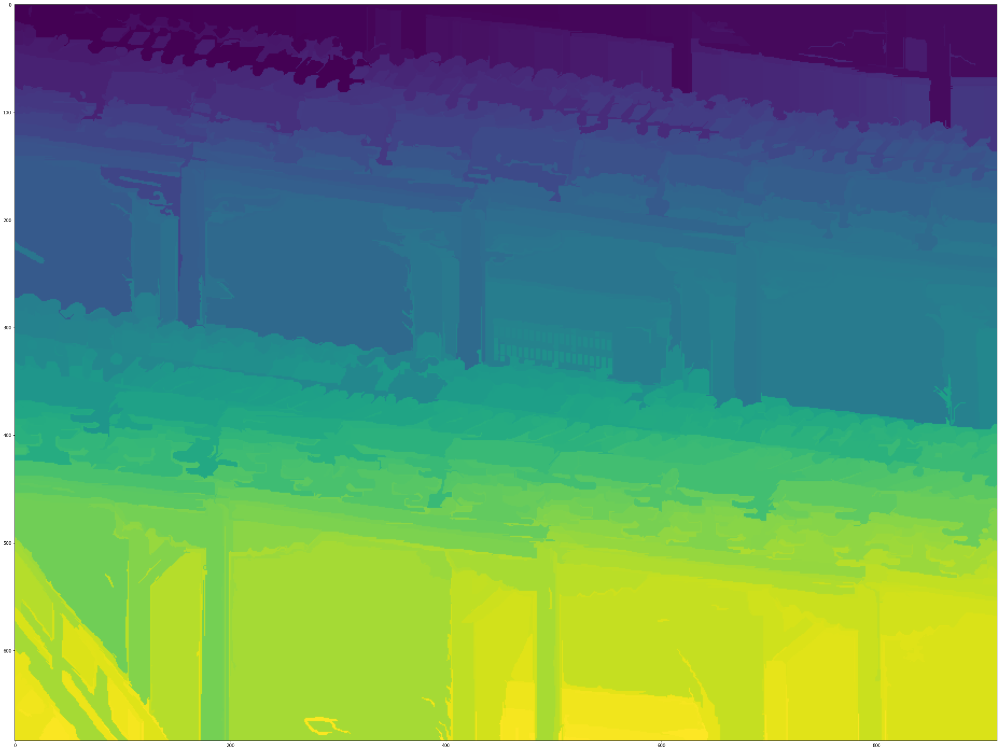

Postprocess segmentation


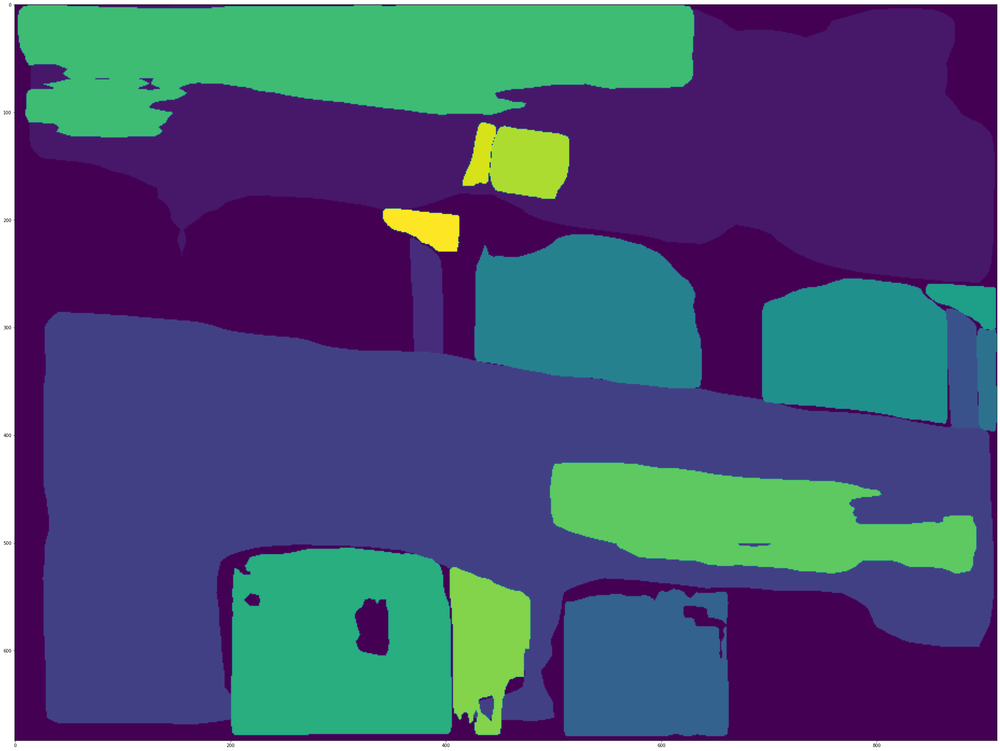

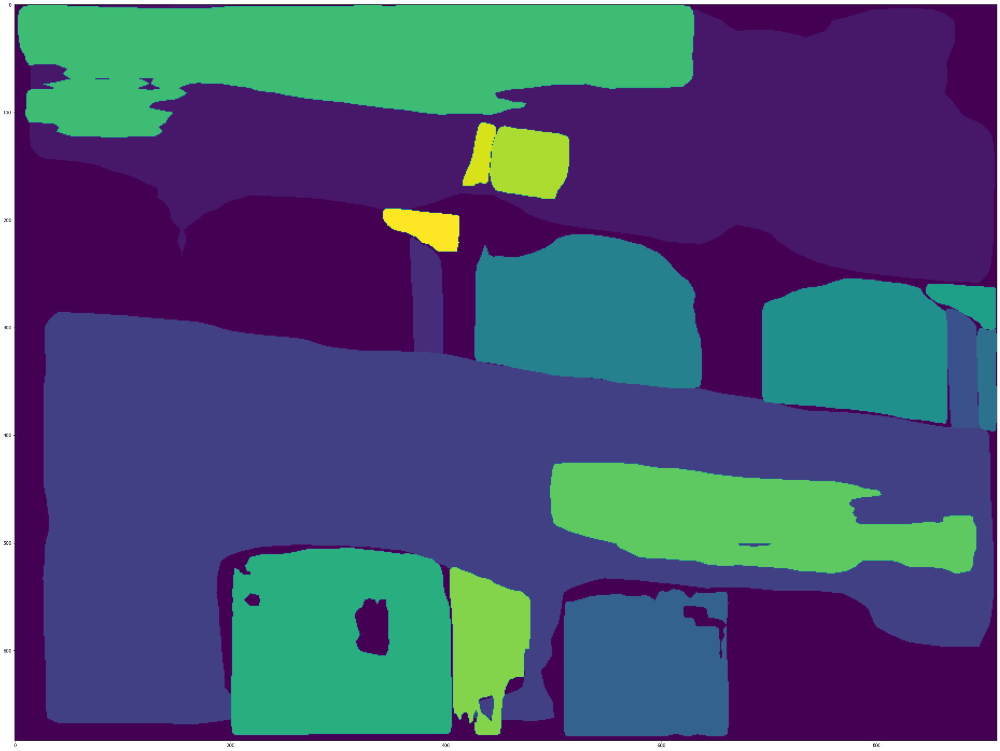

KeyboardInterrupt: 

In [16]:
ind=3
categories=get_panoptic_categories()
for imgs in imgs_list[ind:]:
    
    print("Predict points")
    image0, inp0, scales0 = read_image(input_dir + imgs[0], device, RESIZE, ROT0, RESIZE_FLOAT)
    image1, inp1, scales1 = read_image(input_dir + imgs[1], device, RESIZE, ROT1, RESIZE_FLOAT)
    
    pred = matching({'image0': inp0, 'image1': inp1})
    pred = {k: v[0].cpu().numpy() for k, v in pred.items()}
    kpts0, kpts1 = pred['keypoints0'], pred['keypoints1']
    matches, conf = pred['matches0'], pred['matching_scores0']
    
    out_matches = {'keypoints0': kpts0, 'keypoints1': kpts1,
                   'matches': matches, 'match_confidence': conf}
    
    valid = (matches > -1) & (conf>0.8)
    mkpts0 = kpts0[valid]
    mkpts1 = kpts1[matches[valid]]
    
    mkpts0 *= scales0
    mkpts1 *= scales1
    
    image0 = cv2.imread(input_dir + imgs[0])
    image1 = cv2.imread(input_dir + imgs[1])
    
    masks1 = preprocess_mask(cv2.resize(image1,(image1.shape[1]//2,image1.shape[0]//2)), predictor_buildings,predictor_panoptic, categories)
    plt.imshow(masks1)
    plt.show()
    masks1 = cv2.resize(masks1,(image1.shape[1],image1.shape[0]), interpolation=cv2.INTER_NEAREST)
    imageio.imwrite('test_data/'+str(ind)+'_mask.jpg', cv2.normalize(masks1,masks1, 0, 255, cv2.NORM_MINMAX))
    
    masks0 = preprocess_mask(cv2.resize(image0,(image0.shape[1]//2,image0.shape[0]//2)), predictor_buildings,predictor_panoptic, categories)
    plt.imshow(masks0)
    plt.show()
    masks0 = cv2.resize(masks0,(image0.shape[1],image0.shape[0]), interpolation=cv2.INTER_NEAREST)
    
    image0=image0[..., [2, 1, 0]]
    image1=image1[..., [2, 1, 0]]
        
    transformed_image0 = pipeline(mkpts0, mkpts1, image0, image1,masks0,masks1,predictor_panoptic)
    imageio.imwrite('test_data/'+str(ind)+'_image.jpg',transformed_image0)
    plt.imshow(np.concatenate([transformed_image0,image0],axis=1))
    plt.show()
    ind+=1
    
    
    
    

In [ ]:
ind=3
categories=get_panoptic_categories()
for imgs in imgs_list[ind:]:
    
    
    print("Predict points")
    image0, inp0, scales0 = read_image(input_dir + imgs[0], device, RESIZE, ROT0, RESIZE_FLOAT)
    image1, inp1, scales1 = read_image(input_dir + imgs[1], device, RESIZE, ROT1, RESIZE_FLOAT)

    pred = matching({'image0': inp0, 'image1': inp1})
    pred = {k: v[0].cpu().numpy() for k, v in pred.items()}
    kpts0, kpts1 = pred['keypoints0'], pred['keypoints1']
    matches, conf = pred['matches0'], pred['matching_scores0']
    # Write the matches to disk.
    out_matches = {'keypoints0': kpts0, 'keypoints1': kpts1,
                       'matches': matches, 'match_confidence': conf}

    valid = (matches > -1) & (conf>0.9)
    mkpts0 = kpts0[valid]
    mkpts1 = kpts1[matches[valid]]
    
    mkpts0 *= scales0
    mkpts1 *= scales1

    image0 = cv2.imread(input_dir + imgs[0])
    image1 = cv2.imread(input_dir + imgs[1])
    
    masks1 = preprocess_mask(cv2.resize(image1,(image1.shape[1]//2,image1.shape[0]//2)), predictor_buildings,predictor_panoptic, categories)
    plt.imshow(masks1)
    plt.show()
    masks1 = cv2.resize(masks1,(image1.shape[1],image1.shape[0]), interpolation=cv2.INTER_NEAREST)
    imageio.imwrite('test_data/'+str(ind)+'_mask.jpg', cv2.normalize(masks1,masks1, 0, 255, cv2.NORM_MINMAX))
    
    masks0 = preprocess_mask(cv2.resize(image0,(image0.shape[1]//2,image0.shape[0]//2)), predictor_buildings,predictor_panoptic, categories)
    masks0 = cv2.resize(masks0,(image0.shape[1],image0.shape[0]), interpolation=cv2.INTER_NEAREST)
    plt.imshow(masks0)
    plt.show()
    
    image0=image0[..., [2, 1, 0]]
    image1=image1[..., [2, 1, 0]]
        
    transformed_image0 = pipeline(mkpts0, mkpts1, image0, image1,masks0,masks1,predictor_panoptic)
    imageio.imwrite('test_data/'+str(ind)+'_image.jpg',transformed_image0)
    plt.imshow(np.concatenate([transformed_image0,image0],axis=1))
    plt.show()
    ind+=1


Add a bit class



Add a bit class



Transforme...


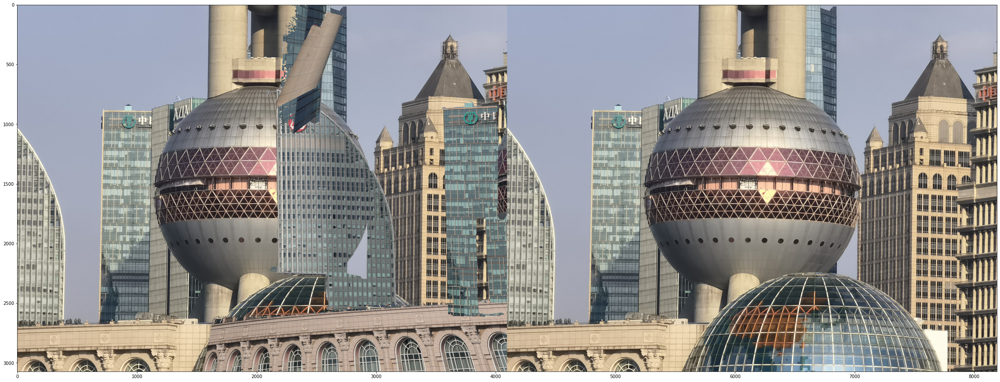

In [18]:
transformed_image0 = pipeline(mkpts0, mkpts1, image0, image1,masks0,masks1,predictor_panoptic)
imageio.imwrite('test_data/'+str(ind)+'_image0.jpg',transformed_image0)
plt.imshow(np.concatenate([transformed_image0,image0],axis=1))
plt.show()

Add a bit class



100%|██████████| 26/26 [00:37<00:00,  1.44s/it]

  0%|          | 0/14 [00:00<?, ?it/s]

Add a bit class



100%|██████████| 14/14 [00:08<00:00,  1.60it/s]


Transforme...



 19%|█▉        | 25/129 [00:00<00:02, 49.26it/s]

  0%|          | 0/57 [00:00<?, ?it/s]

  4%|▎         | 2/57 [00:00<00:03, 14.44it/s]

  7%|▋         | 4/57 [00:00<00:03, 14.98it/s]

 11%|█         | 6/57 [00:00<00:03, 15.14it/s]

 14%|█▍        | 8/57 [00:00<00:03, 15.20it/s]

 18%|█▊        | 10/57 [00:00<00:03, 15.07it/s]

 21%|██        | 12/57 [00:00<00:02, 15.35it/s]

 25%|██▍       | 14/57 [00:00<00:02, 15.49it/s]

 28%|██▊       | 16/57 [00:01<00:02, 15.51it/s]

 32%|███▏      | 18/57 [00:01<00:02, 15.33it/s]

 35%|███▌      | 20/57 [00:01<00:02, 15.05it/s]

 39%|███▊      | 22/57 [00:01<00:02, 15.20it/s]

 42%|████▏     | 24/57 [00:01<00:02, 15.59it/s]

 46%|████▌     | 26/57 [00:01<00:01, 15.50it/s]

 49%|████▉     | 28/57 [00:01<00:01, 15.67it/s]

 53%|█████▎    | 30/57 [00:01<00:01, 15.76it/s]

 56%|█████▌    | 32/57 [00:02<00:01, 15.67it/s]

 60%|█████▉    | 34/57 [00:02<00:01, 15.62it/s]

 63%|██████▎   | 36/57 [00:02<00:01, 15.53it/s]

 67%|██████▋   | 38/57 [00:02<0

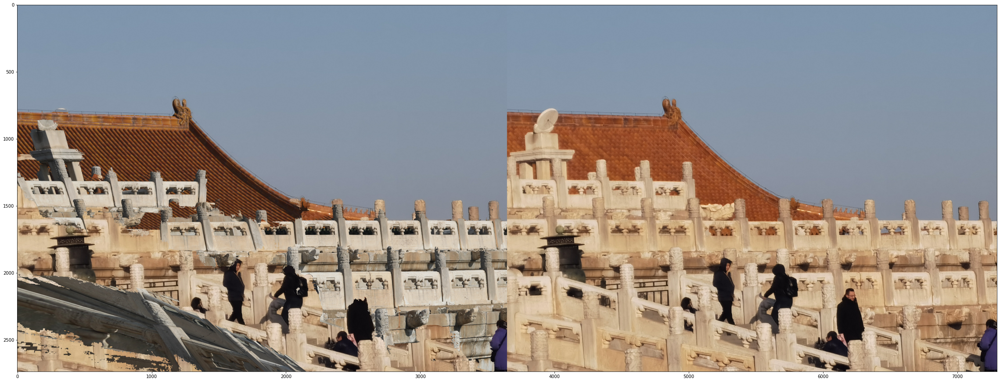

In [15]:
transformed_image0 = pipeline(mkpts0, mkpts1, image0, image1,masks0,masks1,predictor_panoptic)
imageio.imwrite('new_im_reg/'+str(ind)+'_image.jpg',transformed_image0)
plt.imshow(np.concatenate([transformed_image0,image0],axis=1))
plt.show()

Preprocess masks


100%|██████████| 26/26 [01:21<00:00,  3.15s/it]


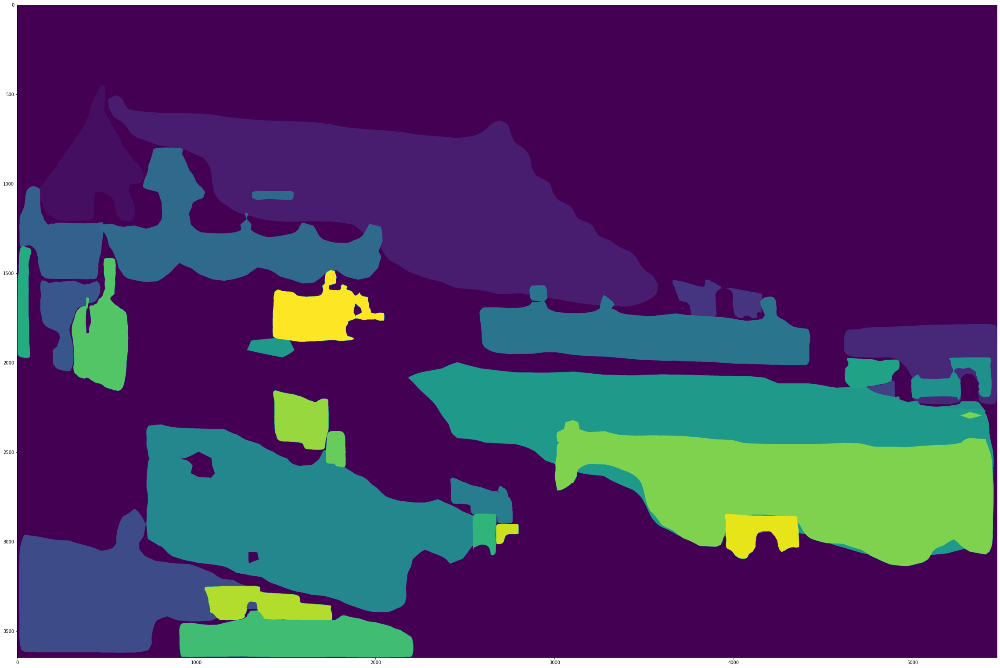

Panoptic segmentation


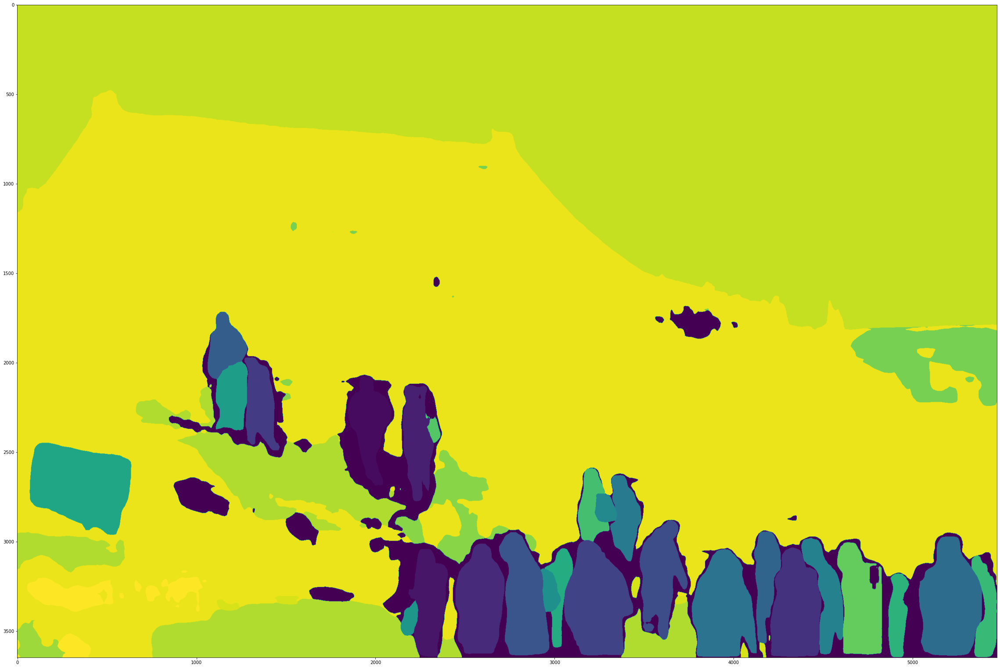

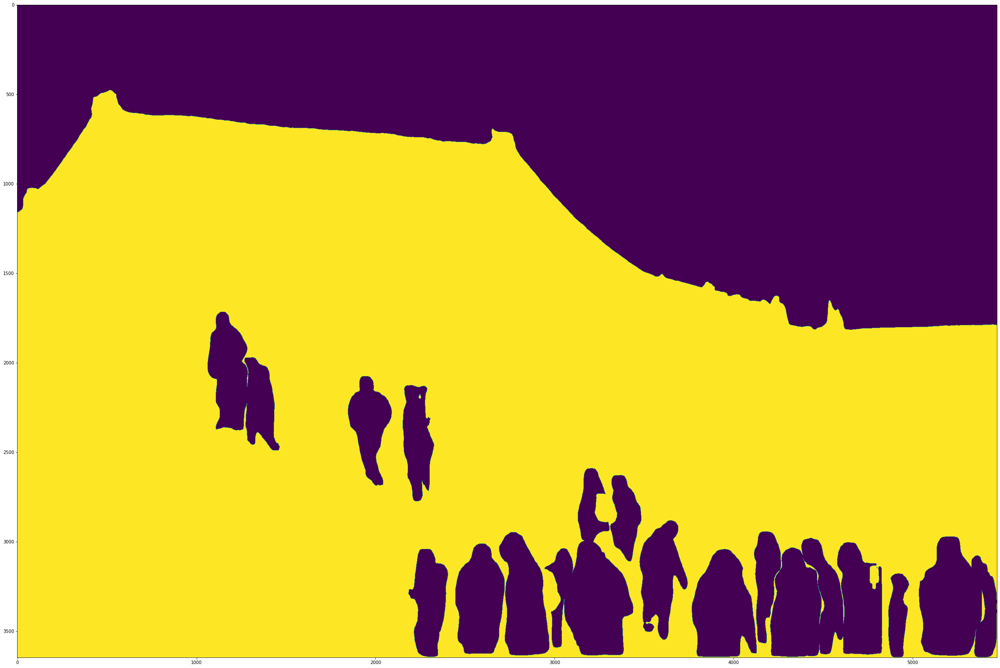

Superpixel segmentation


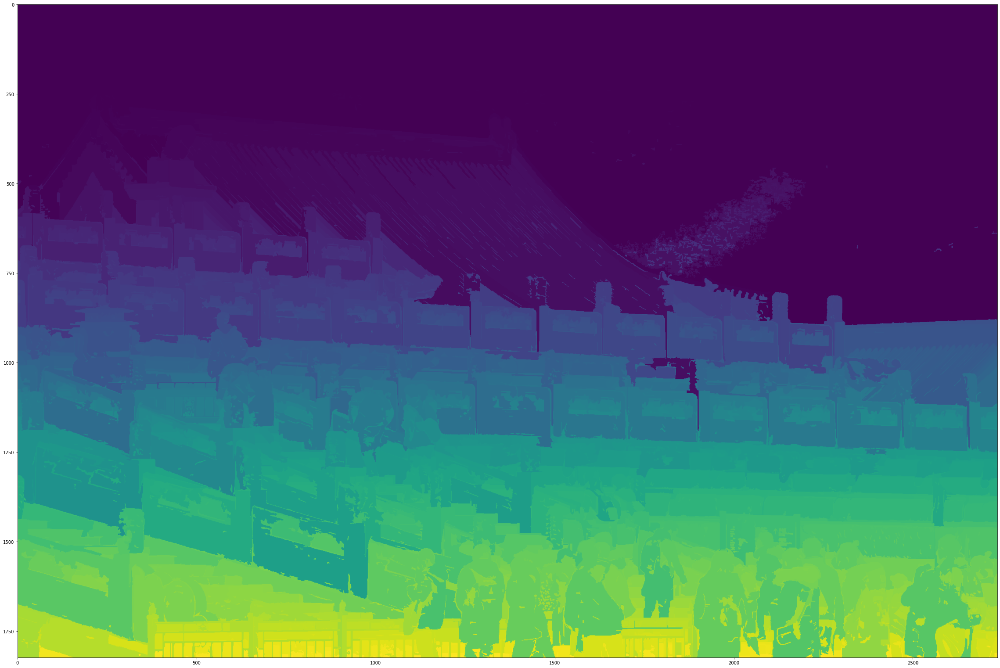

In [16]:
result_mask_build,superpixel_mark,cut_mask,image = preprocess_mask(image1, predictor_buildings,predictor_panoptic, categories)


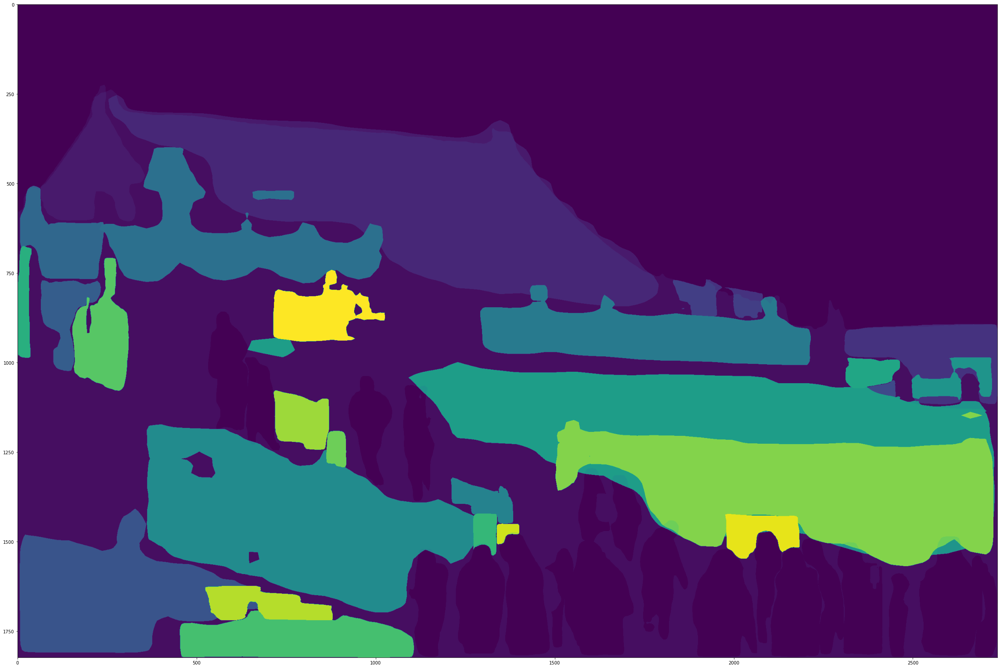


100%|██████████| 1352/1352 [00:20<00:00, 66.58it/s]

100%|██████████| 3369/3369 [00:00<00:00, 30768.68it/s]

 72%|███████▏  | 1321/1824 [00:14<00:06, 80.39it/s]


100%|██████████| 1824/1824 [00:20<00:00, 90.22it/s] 

 61%|██████    | 1230/2017 [00:55<03:03,  4.28it/s]


100%|██████████| 2017/2017 [01:24<00:00, 23.92it/s]


In [42]:
mask_t = preproc_superpixel_mask(result_mask_build,superpixel_mark,cut_mask,image)

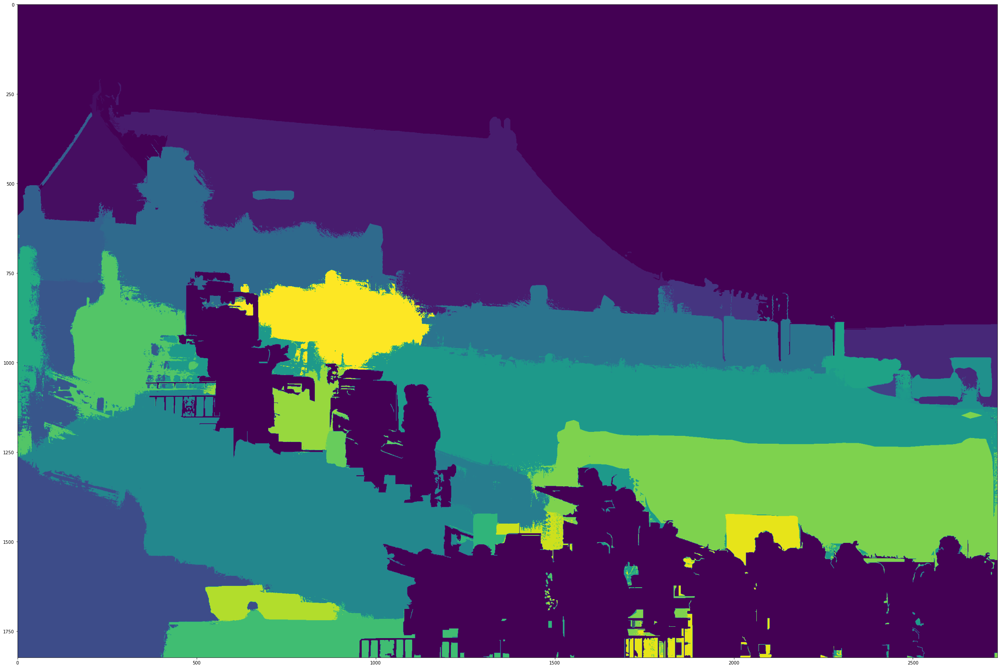

In [43]:
plt.imshow(mask_t)